In [1]:
# %% 
# # ! Setup
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pyshtools as pysh
import pyshtools.constants.Moon as cstMoon
import pygmt
import pyvista as pv
import time

In [2]:
# %% 
# # ! Gravity of Moon
######## * SHGravCoeffs
lmax_grav = 1500
clm_grav_moon = pysh.SHGravCoeffs.from_file('jggrx_1500e_sha.tab', 
                                            lmax=lmax_grav, 
                                            header_units='km', 
                                            errors=True,
                                            omega=cstMoon.angular_velocity.value, 
                                            name='GL1500E (Moon)',
                                            encoding='utf-8')
print('*'*32+'\n' + 'Class SHGravCoeffs: ')
print(clm_grav_moon)
######## * SHGravGrid
r_calc = 1748000.0
#### * Expand
res_grav = 0.1 # degree
grd_grav_moon = clm_grav_moon.expand(a=r_calc,
                                     f=0.0,
                                     lmax=int(90/res_grav)-1, 
                                     lmax_calc=450)
print('*'*32+'\n' + 'Class SHGravGrid')
print(grd_grav_moon)
gz = -1.e5 * grd_grav_moon.rad
dg =  1.e5 * grd_grav_moon.total

********************************
Class SHGravCoeffs: 
  name = 'GL1500E (Moon)'
  kind = 'real'
  normalization = '4pi'
  csphase = 1
  lmax = 1500
  GM (m3 / s2) = 4902800456866.0
  r0 (m) = 1738000.0
  omega (rad / s) = 2.6617072234847315e-06
  error_kind = 'unspecified'
  header = ['0.1738000000000000E+04', '0.4902800456866000E+04', '0.6661800000000000E-05', '1500', '1500', '1', '0.0000000000000000E+00', '0.0000000000000000E+00']
  header2 = None
  epoch = None
********************************
Class SHGravGrid
  name = 'GL1500E (Moon)'
  grid = 'DH'
  n = 1800
  nlat = 1801
  nlon = 3601
  sampling = 2
  extend = True
  lmax = 899
  lmax_calc = 450
  gm (m3 / s2) = 4902800456866.0
  a (m)= 1748000.0
  f = 0.0
  omega (rad / s) = 2.6617072234847315e-06
  normal gravity is removed = True
  units (gravity) = 'm/s2'
  units (potential) = 'm2/s2'
  epoch = None


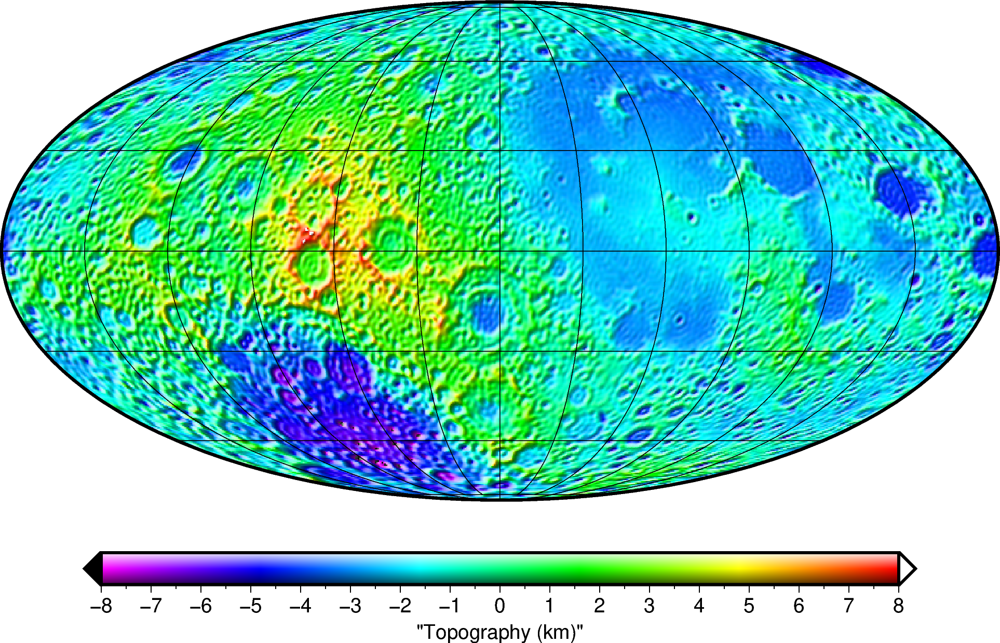

In [ ]:
# # ! Shape of Moon
######## * Shape
clm_shp_moon = pysh.SHCoeffs.from_file('Moon_shape_1439.sh', 
                                       lmax=1439, 
                                       name='LOLA_shape (Moon)',
                                       units='m', format='bshc')
res_topo = 0.5
lmax_pk = int(90/res_topo)-1
grd_shp_moon = clm_shp_moon.expand(lmax=int(90/res_topo)-1,
                                   lmax_calc=lmax_pk)
grd_topo_moon = (grd_shp_moon - clm_grav_moon.r0) / 1.e3 # km
fig = pygmt.Figure()
grd_topo_moon.plotgmt(fig=fig,
                      projection='mollweide',
                      central_longitude=-90.,
                      grid=[30, 30],
                      tick_interval=None,
                      cmap='rainbow',
                      cmap_limits=[-8, 8],
                      colorbar='bottom',
                      cb_triangles='both',
                      cb_label='Topography (km)',
                      cb_tick_interval=1,
                      cb_minor_tick_interval=0.5,
                      shading=grd_topo_moon)
fig.show(width=800)

In [ ]:
# # ! Computation of topographic potential: Spectral-domain 
print('nmax | time_sec |        min |        max |       mean |        std')
print('-'*70)
results = []
for nmax_val in range(1, 21):
    nthreads = 1
    t0 = time.time()
    clm_topograv_moon = pysh.SHGravCoeffs.from_shape(shape=clm_shp_moon,
                                                     rho=2560.0,
                                                     gm=clm_grav_moon.gm,
                                                     nmax=nmax_val,
                                                     lmax=lmax_pk,
                                                     lmax_grid=lmax_pk,
                                                     lmax_calc=lmax_pk,
                                                     name=f'LOLA_Topo_Grav (Moon) nmax={nmax_val}',
                                                     backend='ducc',
                                                     nthreads=nthreads)
    tc = time.time() - t0

    res_topograv = res_topo # degree
    grd_grav_moon_tmp = clm_topograv_moon.expand(a=r_calc,
                                                 f=0.0,
                                                 lmax=int(90/res_topograv)-1, 
                                                 lmax_calc=lmax_pk)
    gz_topo_tmp = -1.e5 * grd_grav_moon_tmp.rad

    min_val = np.min(gz_topo_tmp.data)
    max_val = np.max(gz_topo_tmp.data)
    mean_val = np.mean(gz_topo_tmp.data)
    std_val = np.std(gz_topo_tmp.data)

    results.append((nmax_val, tc, min_val, max_val, mean_val, std_val))
    print(f"{nmax_val:4d} | {tc:8.3f} | {min_val:12.4f} | {max_val:12.4f} | {mean_val:12.4f} | {std_val:12.4f}")

grd_grav_moon = grd_grav_moon_tmp
gz_topo = gz_topo_tmp



nmax | time_sec |        min |        max |       mean |        std
----------------------------------------------------------------------
   1 |    0.012 |    -789.7943 |    1004.5847 |     -35.7392 |     245.3979
   2 |    0.014 |    -721.0216 |    1066.0961 |     -35.2391 |     245.7696
   3 |    0.020 |    -731.1819 |    1076.0930 |     -35.2384 |     245.8644
   4 |    0.026 |    -729.5450 |    1077.9331 |     -35.2385 |     245.8672
   5 |    0.037 |    -729.7125 |    1078.2319 |     -35.2385 |     245.8677
   6 |    0.038 |    -729.6939 |    1078.2741 |     -35.2385 |     245.8677
   7 |    0.042 |    -729.6957 |    1078.2791 |     -35.2385 |     245.8677
   8 |    0.060 |    -729.6956 |    1078.2797 |     -35.2385 |     245.8677
   9 |    0.053 |    -729.6956 |    1078.2797 |     -35.2385 |     245.8677
  10 |    0.060 |    -729.6956 |    1078.2797 |     -35.2385 |     245.8677
  11 |    0.074 |    -729.6956 |    1078.2797 |     -35.2385 |     245.8677
  12 |    0.072 |    -729

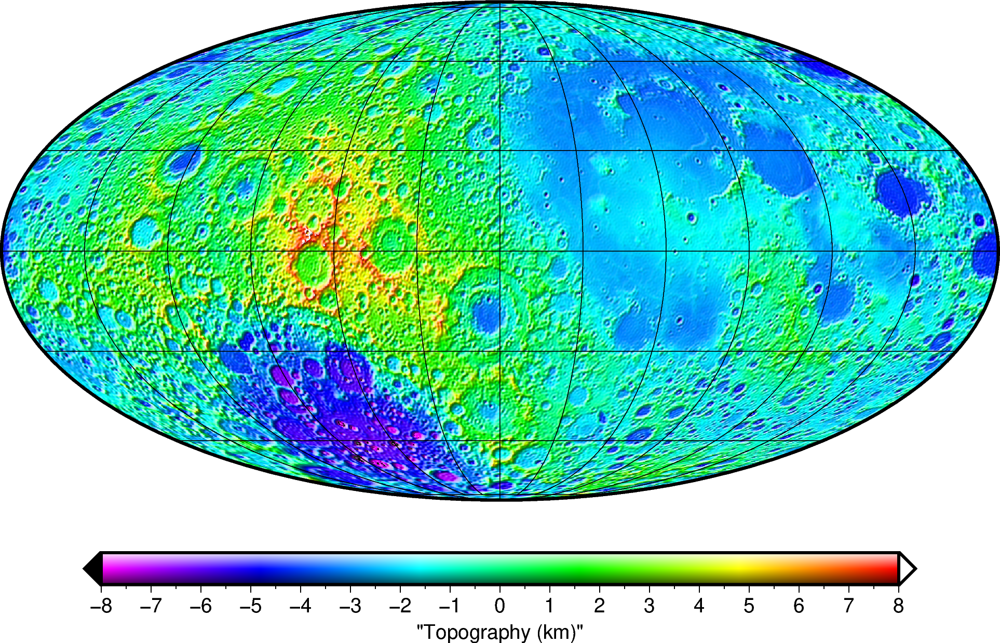

In [ ]:
# # ! Shape of Moon
######## * Shape
clm_shp_moon = pysh.SHCoeffs.from_file('Moon_shape_1439.sh', 
                                       lmax=1439, 
                                       name='LOLA_shape (Moon)',
                                       units='m', format='bshc')
res_topo = 0.25
lmax_pk = int(90/res_topo)-1
grd_shp_moon = clm_shp_moon.expand(lmax=int(90/res_topo)-1,
                                   lmax_calc=lmax_pk)
grd_topo_moon = (grd_shp_moon - clm_grav_moon.r0) / 1.e3 # km
fig = pygmt.Figure()
grd_topo_moon.plotgmt(fig=fig,
                      projection='mollweide',
                      central_longitude=-90.,
                      grid=[30, 30],
                      tick_interval=None,
                      cmap='rainbow',
                      cmap_limits=[-8, 8],
                      colorbar='bottom',
                      cb_triangles='both',
                      cb_label='Topography (km)',
                      cb_tick_interval=1,
                      cb_minor_tick_interval=0.5,
                      shading=grd_topo_moon)
fig.show(width=800)

In [ ]:
# # ! Computation of topographic potential: Spectral-domain 
print('nmax | time_sec |        min |        max |       mean |        std')
print('-'*70)
results = []
for nmax_val in range(1, 21):
    nthreads = 1
    t0 = time.time()
    clm_topograv_moon = pysh.SHGravCoeffs.from_shape(shape=clm_shp_moon,
                                                     rho=2560.0,
                                                     gm=clm_grav_moon.gm,
                                                     nmax=nmax_val,
                                                     lmax=lmax_pk,
                                                     lmax_grid=lmax_pk,
                                                     lmax_calc=lmax_pk,
                                                     name=f'LOLA_Topo_Grav (Moon) nmax={nmax_val}',
                                                     backend='ducc',
                                                     nthreads=nthreads)
    tc = time.time() - t0

    res_topograv = res_topo # degree
    grd_grav_moon_tmp = clm_topograv_moon.expand(a=r_calc,
                                                 f=0.0,
                                                 lmax=int(90/res_topograv)-1, 
                                                 lmax_calc=lmax_pk)
    gz_topo_tmp = -1.e5 * grd_grav_moon_tmp.rad

    min_val = np.min(gz_topo_tmp.data)
    max_val = np.max(gz_topo_tmp.data)
    mean_val = np.mean(gz_topo_tmp.data)
    std_val = np.std(gz_topo_tmp.data)

    results.append((nmax_val, tc, min_val, max_val, mean_val, std_val))
    print(f"{nmax_val:4d} | {tc:8.3f} | {min_val:12.4f} | {max_val:12.4f} | {mean_val:12.4f} | {std_val:12.4f}")

grd_grav_moon = grd_grav_moon_tmp
gz_topo = gz_topo_tmp


nmax | time_sec |        min |        max |       mean |        std
----------------------------------------------------------------------
   1 |    0.636 |    -766.1594 |    1024.1635 |     -35.6239 |     245.8466
   2 |    0.134 |    -719.3111 |    1123.3335 |     -35.0957 |     246.2833
   3 |    0.173 |    -721.3060 |    1157.2278 |     -35.0947 |     246.4042
   4 |    0.234 |    -721.9500 |    1169.3076 |     -35.0948 |     246.4111
   5 |    0.273 |    -721.6294 |    1173.1381 |     -35.0948 |     246.4126
   6 |    0.302 |    -721.7027 |    1174.2127 |     -35.0948 |     246.4128
   7 |    0.353 |    -721.6879 |    1174.4824 |     -35.0948 |     246.4128
   8 |    0.404 |    -721.6903 |    1174.5435 |     -35.0948 |     246.4128
   9 |    0.444 |    -721.6899 |    1174.5561 |     -35.0948 |     246.4128
  10 |    0.505 |    -721.6900 |    1174.5584 |     -35.0948 |     246.4128
  11 |    0.587 |    -721.6900 |    1174.5589 |     -35.0948 |     246.4128
  12 |    0.621 |    -721

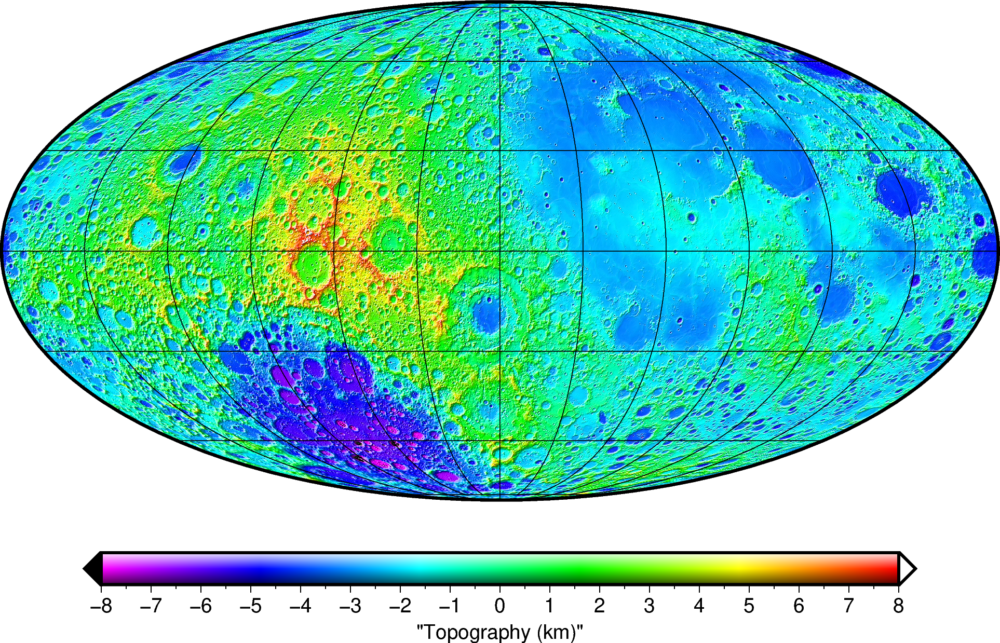

In [ ]:
# # ! Shape of Moon
######## * Shape
clm_shp_moon = pysh.SHCoeffs.from_file('Moon_shape_1439.sh', 
                                       lmax=1439, 
                                       name='LOLA_shape (Moon)',
                                       units='m', format='bshc')
res_topo = 0.1
lmax_pk = int(90/res_topo)-1
grd_shp_moon = clm_shp_moon.expand(lmax=int(90/res_topo)-1,
                                   lmax_calc=lmax_pk)
grd_topo_moon = (grd_shp_moon - clm_grav_moon.r0) / 1.e3 # km
fig = pygmt.Figure()
grd_topo_moon.plotgmt(fig=fig,
                      projection='mollweide',
                      central_longitude=-90.,
                      grid=[30, 30],
                      tick_interval=None,
                      cmap='rainbow',
                      cmap_limits=[-8, 8],
                      colorbar='bottom',
                      cb_triangles='both',
                      cb_label='Topography (km)',
                      cb_tick_interval=1,
                      cb_minor_tick_interval=0.5,
                      shading=grd_topo_moon)
fig.show(width=800)

In [ ]:
# # ! Computation of topographic potential: Spectral-domain 
print('nmax | time_sec |        min |        max |       mean |        std')
print('-'*70)
results = []
for nmax_val in range(1, 21):
    nthreads = 1
    t0 = time.time()
    clm_topograv_moon = pysh.SHGravCoeffs.from_shape(shape=clm_shp_moon,
                                                     rho=2560.0,
                                                     gm=clm_grav_moon.gm,
                                                     nmax=nmax_val,
                                                     lmax=lmax_pk,
                                                     lmax_grid=lmax_pk,
                                                     lmax_calc=lmax_pk,
                                                     name=f'LOLA_Topo_Grav (Moon) nmax={nmax_val}',
                                                     backend='ducc',
                                                     nthreads=nthreads)
    tc = time.time() - t0

    res_topograv = res_topo # degree
    grd_grav_moon_tmp = clm_topograv_moon.expand(a=r_calc,
                                                 f=0.0,
                                                 lmax=int(90/res_topograv)-1, 
                                                 lmax_calc=lmax_pk)
    gz_topo_tmp = -1.e5 * grd_grav_moon_tmp.rad

    min_val = np.min(gz_topo_tmp.data)
    max_val = np.max(gz_topo_tmp.data)
    mean_val = np.mean(gz_topo_tmp.data)
    std_val = np.std(gz_topo_tmp.data)

    results.append((nmax_val, tc, min_val, max_val, mean_val, std_val))
    print(f"{nmax_val:4d} | {tc:8.3f} | {min_val:12.4f} | {max_val:12.4f} | {mean_val:12.4f} | {std_val:12.4f}")

grd_grav_moon = grd_grav_moon_tmp
gz_topo = gz_topo_tmp


nmax | time_sec |        min |        max |       mean |        std
----------------------------------------------------------------------
   1 |    1.777 |    -768.3317 |    1029.2375 |     -35.5723 |     245.9894
   2 |    1.802 |    -719.4262 |    1136.9147 |     -35.0271 |     246.4418
   3 |    2.695 |    -722.6754 |    1181.6054 |     -35.0264 |     246.5677
   4 |    3.882 |    -723.3006 |    1204.5030 |     -35.0264 |     246.5765
   5 |    3.778 |    -722.7635 |    1217.7055 |     -35.0264 |     246.5787
   6 |    5.519 |    -722.9666 |    1224.8128 |     -35.0264 |     246.5791
   7 |    6.535 |    -722.8811 |    1228.6015 |     -35.0264 |     246.5793
   8 |    6.577 |    -722.9217 |    1230.5621 |     -35.0264 |     246.5793
   9 |    8.334 |    -722.9022 |    1231.5324 |     -35.0264 |     246.5793
  10 |    9.144 |    -722.9103 |    1231.9872 |     -35.0264 |     246.5793
  11 |    9.534 |    -722.9072 |    1232.1882 |     -35.0264 |     246.5793
  12 |   10.417 |    -722

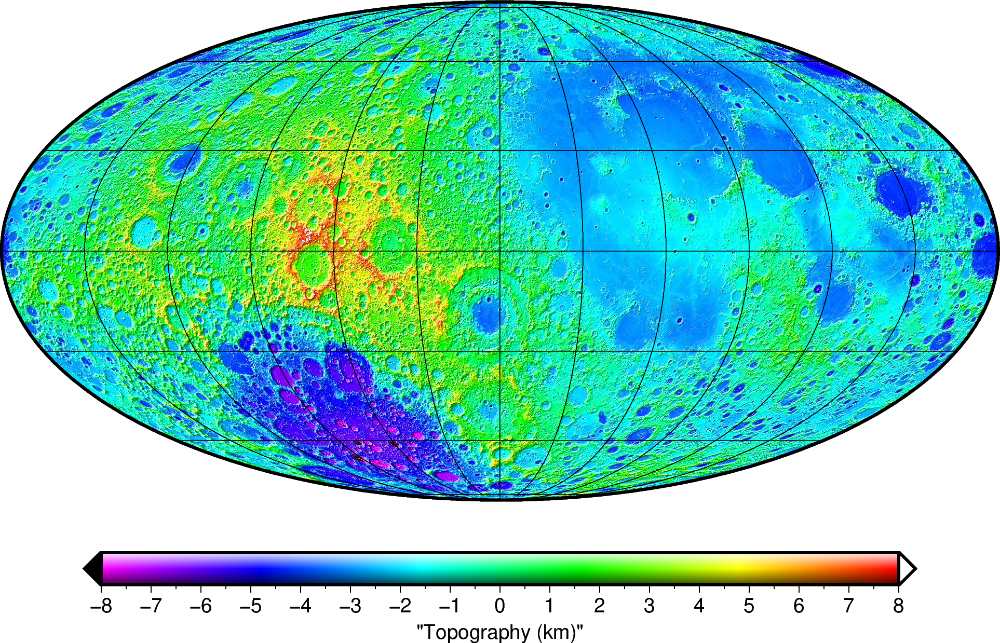

In [ ]:
# # ! Shape of Moon
######## * Shape
clm_shp_moon = pysh.SHCoeffs.from_file('Moon_shape_1439.sh', 
                                       lmax=1439, 
                                       name='LOLA_shape (Moon)',
                                       units='m', format='bshc')
res_topo = 0.05
lmax_pk = int(90/res_topo)-1
grd_shp_moon = clm_shp_moon.expand(lmax=int(90/res_topo)-1,
                                   lmax_calc=lmax_pk)
grd_topo_moon = (grd_shp_moon - clm_grav_moon.r0) / 1.e3 # km
fig = pygmt.Figure()
grd_topo_moon.plotgmt(fig=fig,
                      projection='mollweide',
                      central_longitude=-90.,
                      grid=[30, 30],
                      tick_interval=None,
                      cmap='rainbow',
                      cmap_limits=[-8, 8],
                      colorbar='bottom',
                      cb_triangles='both',
                      cb_label='Topography (km)',
                      cb_tick_interval=1,
                      cb_minor_tick_interval=0.5,
                      shading=grd_topo_moon)
fig.show(width=800)

In [ ]:
# # ! Computation of topographic potential: Spectral-domain 
print('nmax | time_sec |        min |        max |       mean |        std')
print('-'*70)
results = []
for nmax_val in range(1, 21):
    nthreads = 1
    t0 = time.time()
    clm_topograv_moon = pysh.SHGravCoeffs.from_shape(shape=clm_shp_moon,
                                                     rho=2560.0,
                                                     gm=clm_grav_moon.gm,
                                                     nmax=nmax_val,
                                                     lmax=lmax_pk,
                                                     lmax_grid=lmax_pk,
                                                     lmax_calc=lmax_pk,
                                                     name=f'LOLA_Topo_Grav (Moon) nmax={nmax_val}',
                                                     backend='ducc',
                                                     nthreads=nthreads)
    tc = time.time() - t0
    res_topograv = res_topo # degree
    grd_grav_moon_tmp = clm_topograv_moon.expand(a=r_calc,
                                                 f=0.0,
                                                 lmax=int(90/res_topograv)-1, 
                                                 lmax_calc=lmax_pk)
    gz_topo_tmp = -1.e5 * grd_grav_moon_tmp.rad
    min_val = np.min(gz_topo_tmp.data)
    max_val = np.max(gz_topo_tmp.data)
    mean_val = np.mean(gz_topo_tmp.data)
    std_val = np.std(gz_topo_tmp.data)
    results.append((nmax_val, tc, min_val, max_val, mean_val, std_val))
    print(f"{nmax_val:4d} | {tc:8.3f} | {min_val:12.4f} | {max_val:12.4f} | {mean_val:12.4f} | {std_val:12.4f}")
grd_grav_moon = grd_grav_moon_tmp
gz_topo = gz_topo_tmp


nmax | time_sec |        min |        max |       mean |        std
----------------------------------------------------------------------
   1 |   10.840 |    -768.5238 |    1029.7039 |     -35.5572 |     246.0352
   2 |   19.742 |    -719.5287 |    1136.9610 |     -35.0094 |     246.4890
   3 |   29.711 |    -722.8580 |    1183.4656 |     -35.0087 |     246.6152
   4 |   36.032 |    -723.1976 |    1206.1985 |     -35.0088 |     246.6240
   5 |   43.281 |    -722.8995 |    1216.8408 |     -35.0088 |     246.6262
   6 |   52.272 |    -722.9279 |    1223.2071 |     -35.0088 |     246.6267
   7 |   59.000 |    -722.9456 |    1226.2316 |     -35.0088 |     246.6268
   8 |   69.509 |    -722.9390 |    1229.2706 |     -35.0088 |     246.6269
   9 |   78.040 |    -722.9356 |    1232.8381 |     -35.0088 |     246.6269
  10 |   84.015 |    -722.9411 |    1235.5651 |     -35.0088 |     246.6269
  11 |   95.379 |    -722.9366 |    1237.4637 |     -35.0088 |     246.6269
  12 |  107.686 |    -722